In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import rcParams
import lmfit
import matplotlib.image as mpimg
from PIL import Image
from pathlib import Path
from collections import OrderedDict
from lmfit.models import LorentzianModel

In [2]:
# bokeh packages
from bokeh.io import output_file,show,output_notebook,push_notebook, curdoc
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource,HoverTool,CategoricalColorMapper, Select, Slider
from bokeh.palettes import Category10
from bokeh.layouts import row,column,gridplot,widgetbox
from bokeh.models.widgets import Tabs,Panel
output_notebook()

Loading BokehJS ...

In [3]:
plt.style.use('classic')
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']
rcParams.update({'font.size': 22})
rcParams['xtick.direction'] = 'in'
rcParams['ytick.direction'] = 'in'
rcParams['xtick.top'] = True
rcParams['ytick.right'] = True
rcParams['xtick.major.size'] = 10
rcParams['ytick.major.size'] = 10
rcParams['xtick.minor.size'] = 5
rcParams['ytick.minor.size'] = 5
rcParams['xtick.minor.visible'] = True
rcParams['ytick.minor.visible'] = True

In [4]:
vfolder=Path.cwd()/'vertical'   #folder for vertical cut
hfolder=Path.cwd()/'horizantal'  #folder for horizontal cut
sec_folder=Path.cwd()/'Sunil_Sinha_Nov2019' # folder for sector cut(0,30,60,90,120,150 degree)

In [5]:
def lort(x,amp,L1,background=0):
    lo=amp/(x**2+(1/L1**2))
    return lo + background 

def lort2(x,amp,L1,background=0):
    lo2=amp/(x**2+(1/L1**2))**2
    return lo2 + background

#Lorentzian and lorentzian square
def lort_lort2(x,amp1,amp2,L1,L2,background=0):
    lo=amp1/(x**2+(1/L1**2))
    lo2=amp2/(x**2+(1/L2**2))**2
    return lo+ lo2 + background

#Guinier Approximation
#ln(q)=lnI0-Rg**2/3*q**2
def guin(x, slope, intensity, background=0):   
    return (np.log(intensity) - slope*x) +background

In [6]:
#genfromtxt(fname, dtype, comments, delimiter, skip_header, skip_footer, 
    #          converters, missing_values, filling_values, usecols, names, excludelist, deletechars, 
    #          replace_space, autostrip, case_sensitive, defaultfmt, unpack, usemask, loose, 
    #          invalid_raise, max_rows, encoding)  
    
#loading data using numpy
def load_data(filename):
    return np.genfromtxt(filename, delimiter='', skip_header=5, usecols=[0,1])

#selecting the range 
def extract_peak(data,xrange):
    idx = np.logical_and(xrange[0] < data[:,0],data[:,0] < xrange[1])
    return data[idx,:]

In [7]:
#making dictionary for selected folder
def load_folder(folder,name):
    temp = {}
    for file in folder.glob(name):
        d = load_data(file)
        k = file.name[1:12]
        temp[k] = d
    return OrderedDict(sorted(temp.items()))

#for sector cut files which has header with 14 rows
def load_folder1(folder,name):
    temp = {}
    for file in folder.glob(name):
        d = np.genfromtxt(file, delimiter='', skip_header=14, usecols=[0,1])
        k = file.name[0:12]
        temp[k] = d
    return OrderedDict(sorted(temp.items()))

In [8]:
#plotting using Bokeh
def bokeh_plot(data,x_range=[0.001, 0.07], y_range=[0.0001, 3000] ):
    f = figure(x_range=x_range, y_range=y_range,x_axis_type="log",y_axis_type="log",
               x_axis_label='Q', y_axis_label="Intensity") 
    for k,color in zip(data,Category10[10]):
        d = extract_peak(data[k],x_range)
        f.circle(d[:,0],d[:,1],color=color, legend_label=k,size=6,alpha=1,
                     hover_color='purple', hover_alpha=0.6)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
    show(f)

In [9]:
def tabs_plot(data, x_range=[0.001, 0.07], y_range=[0.001, 3000]):
    tabs=[]
    for k in data:
        d = data[k]
        f=figure(x_range=x_range, y_range=y_range,x_axis_type="log", y_axis_type="log",
                 x_axis_label='Q', y_axis_label="Intensity")
        x=d[:,0]
        y=d[:,1]
        f.circle(x, y, size=10,fill_color='red',alpha=1,
                     hover_color='purple', hover_alpha=0.6)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=k[:3])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [10]:
#plottting all fields of same temp in one tab
def all_tab_plot(data, folder, x_range=[0.001, 0.07], y_range=[0.001, 3000]): 
    data1=[load_folder(folder, d) for d in data]
    temper=['18K','20K','22K','24K','25K','26K','30K','75K','200K']
    tabs=[]
    for temp, i in zip(data1, range(9)):
        f=figure(x_range=x_range, y_range=y_range, x_axis_type="log", y_axis_type="log", 
                 y_axis_label=' Intensity', x_axis_label='Q')
        for k, color in zip(temp, Category10[10]):
            d = temp[k]
            x=d[:,0]
            y=d[:,1]
            f.circle(x,y, color=color,legend_label=k, alpha=1,size=10,
                     hover_color='purple', hover_alpha=0.6)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=temper[i])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [11]:
#plottting all sector cut of same temp in one tab
def all_tab_secplot(data, folder, x_range=[0.001, 0.01], y_range=[0.1, 3000]): 
    data1=[load_folder1(folder, d) for d in data]
    temper=['18K','20K','24K','26K','30K']
    tabs=[]
    for temp, i in zip(data1, range(5)):
        f=figure(x_range=x_range, y_range=y_range,x_axis_type="log", y_axis_type="log", 
                 y_axis_label=' Intensity', x_axis_label='Q')
        for k, color in zip(temp, Category10[10]):
            d = temp[k]
            x=d[:,0]
            y=d[:,1]
            f.circle(x,y, color=color,legend_label=k, alpha=1,size=10,
                     hover_color='purple', hover_alpha=0.6)
        hover = HoverTool(tooltips=[ ('Q', '@x'), ('I', '@y')], mode='mouse')
        f.add_tools(hover)
        tab = Panel(child=f, title=temper[i])
        tabs.append(tab)
    layout = Tabs(tabs=tabs)
    show(layout)

In [12]:
vfolder=Path.cwd()/'vertical'   #folder for vertical cut
hfolder=Path.cwd()/'horizantal'  #folder for horizontal cut
sec_folder=Path.cwd()/'Sunil_Sinha_Nov2019' # folder for sector cut(0,30,60,90,120,150 degree)


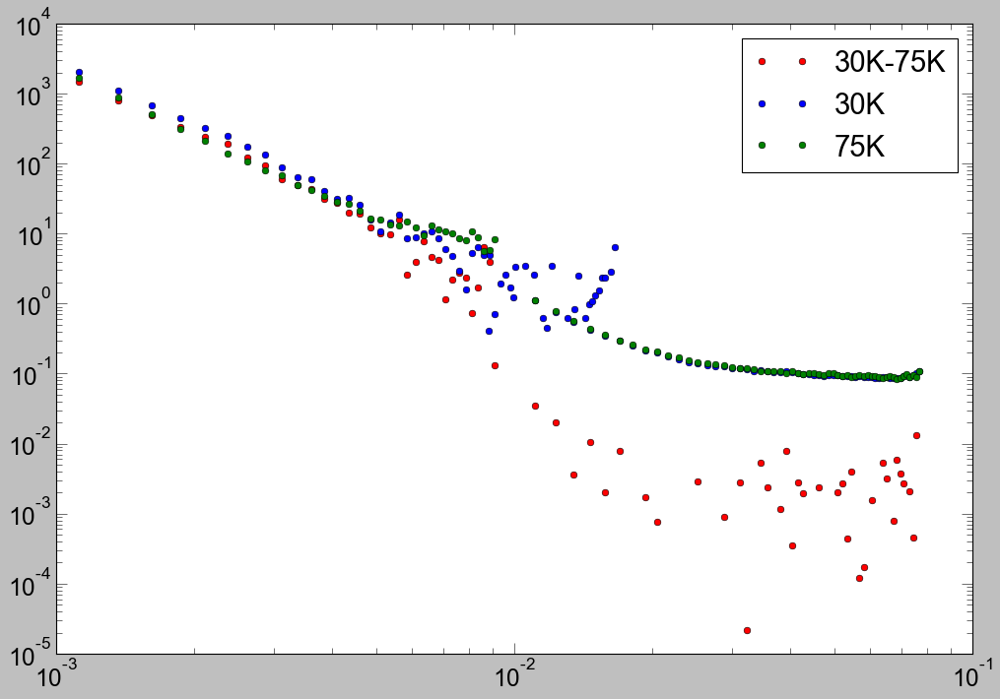

In [13]:
#plotting high temp, subs with high temp and without subsatation 
v30=load_data(Path.cwd()/'vertical/V30K_comb_lowfield.ABS')
v30_ws=load_data(Path.cwd()/'vertical/V30_COMBO_70Oe(without Ba.ABS')
v75=load_data(Path.cwd()/'vertical/V75K_comb_lowfield.ABS')
fig, ax= plt.subplots(figsize=(15,10))
ax.plot(v30[:,0], v30[:,1],'or',label='30K-75K')
ax.plot(v30_ws[:,0], v30_ws[:,1],'ob', label='30K')
ax.plot(v75[:,0], v75[:,1],'og', label='75K')
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlim(0.001, 0.1)
ax.legend()

In [14]:
#vertical cut for specific field
vert_comb_low=load_folder(vfolder,'V*comb*low*.ABS')  #vertical cut for all temp at 700 Oe
vert_comb_1=load_folder(vfolder,'V*comb*1*.ABS')   #vertical cut for all temp at 1 kOe
vert_comb_2=load_folder(vfolder,'V*comb*2*.ABS')  #vertical cut for all temp at 2 kOe

bokeh_plot(vert_comb_low)     #plot all temp in single plot
tabs_plot(data=vert_comb_low)  #plot one temp in one tab

#tabs_plot(vert_comb_1)
#tabs_plot(vert_comb_2)

In [15]:
#all field plot for certain temperature
v_26k=load_folder(vfolder,'V26K_15m*.ABS')
bokeh_plot(v_26k)

In [16]:
#horizontal cut for specific field
horz_comb_low=load_folder(hfolder,'H*comb*low*.ABS') #horizontal cut for all temp at 700 Oe
horz_comb_1=load_folder(hfolder,'H*comb*1*.ABS')   #horizontal cut for all temp at 1 kOe
horz_comb_2=load_folder(hfolder,'H*comb*2*.ABS') #horizontal cut for all temp at 2 kOe

bokeh_plot(horz_comb_low)   #plot all temp in single plot
tabs_plot(data=horz_comb_low)  #plot one temp in one tab

#tabs_plot(horz_comb_1)
#tabs_plot(horz_comb_2)

In [22]:
vert_comb=['V18K*comb*.ABS','V20K*comb*.ABS','V22K*comb*.ABS','V24K*comb*.ABS','V25K*comb*.ABS',
           'V26K*comb*.ABS','V30K*comb*.ABS','V75K*comb*.ABS', 'V200K*comb*.ABS']
horz_comb=['H18K*comb*.ABS','H20K*comb*.ABS','H22K*comb*.ABS','H24K*comb*.ABS','H25K*comb*.ABS',
           'H26K*comb*.ABS','H30K*comb*.ABS','H75K*comb*.ABS','H200K*comb*.ABS']

all_tab_plot(data=vert_comb, folder=vfolder)
all_tab_plot(horz_comb,folder=hfolder)

In [24]:
#for sector plot
sec_15m=['15m_18K*deg*.ASC','15m_20K*deg*.ASC','15m_24K*deg*.ASC','15m_26K*deg*.ASC','15m_30K*deg*.ASC']

all_tab_secplot(data=sec_15m, folder=sec_folder)

In [25]:
#to import multiple figures
# single figures without averaging
igor_2dfig=Path.cwd()/'2d_figures'

        
def twod_figure(filename: str=None) -> None:
    """
    View multiple images stored in files, stacking vertically

    Arguments:
        filename: str - path to filename containing image
    """
    image = Image.open(filename)    #from PIL import Image
    #image = mpimg.imread(filename)
    #plt.figure()
    #plt.imshow(image1)
    display(image)

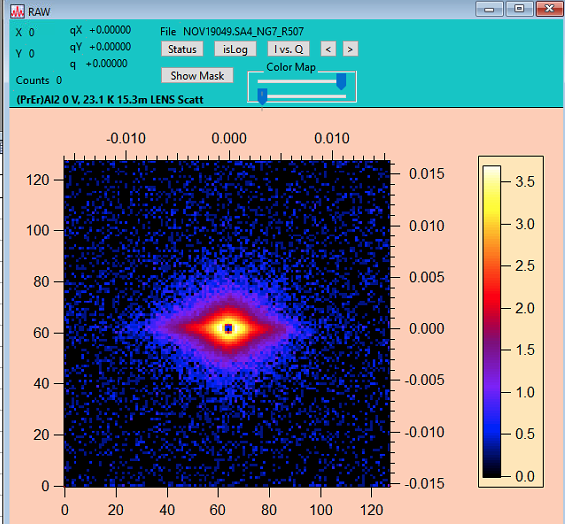

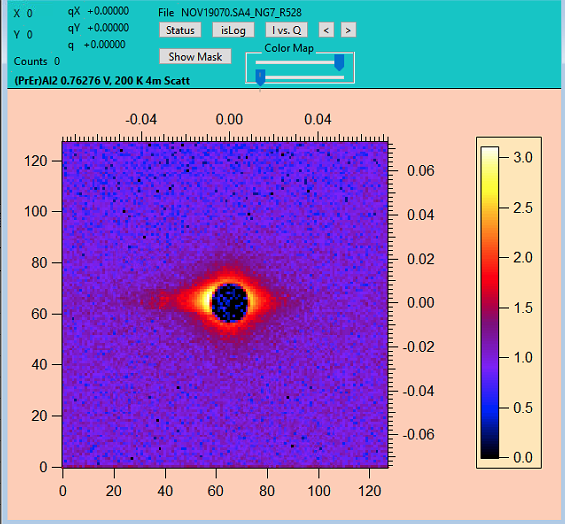

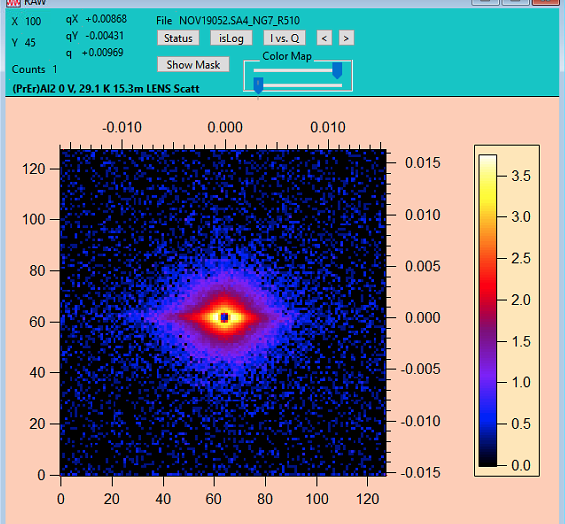

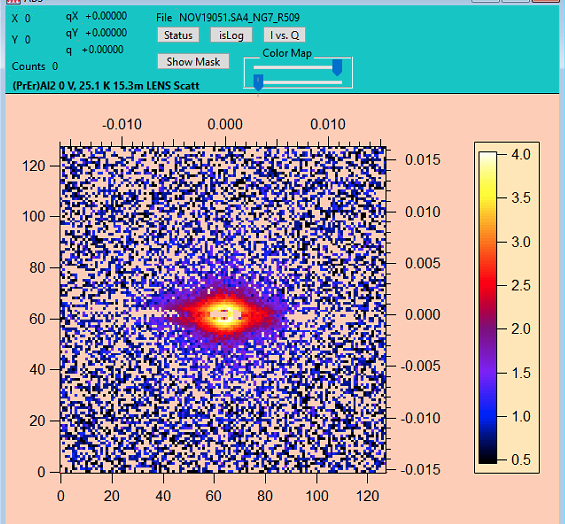

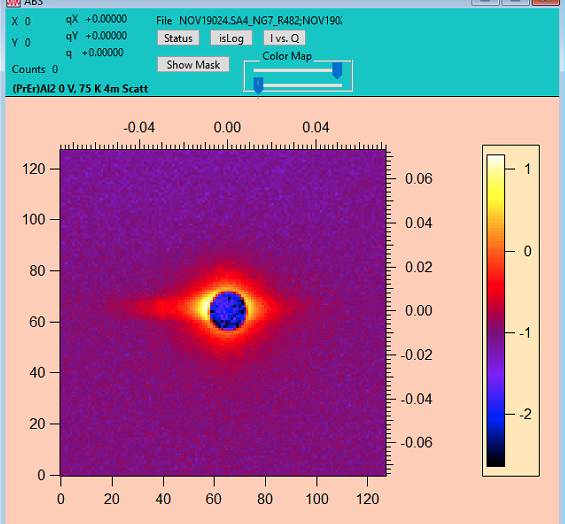

...

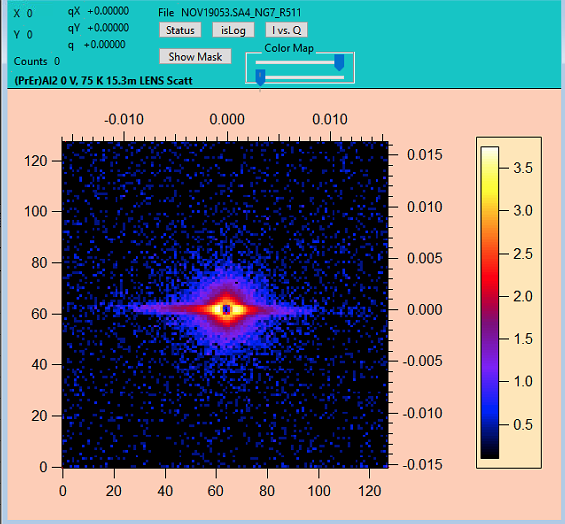

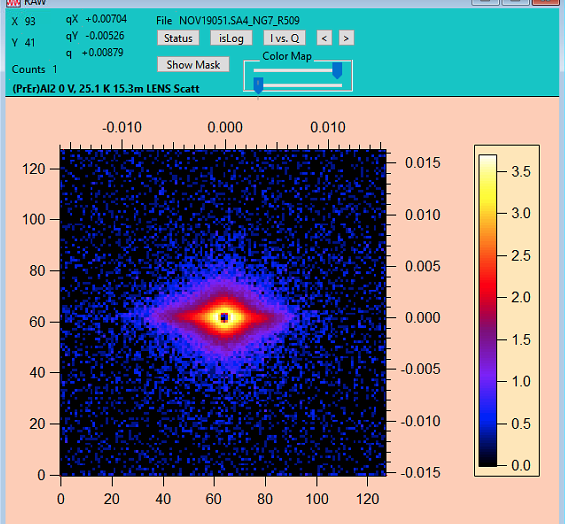

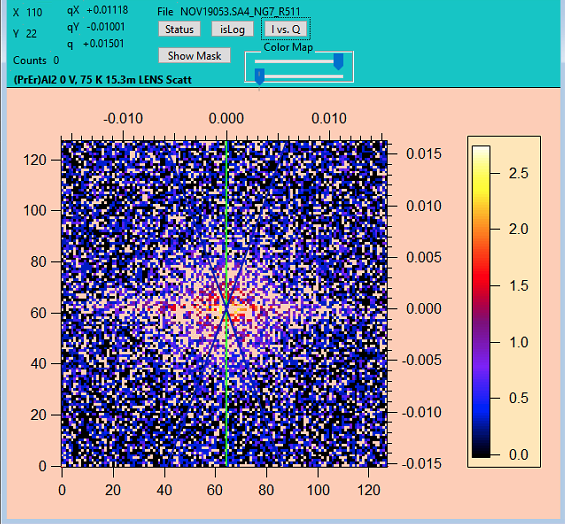

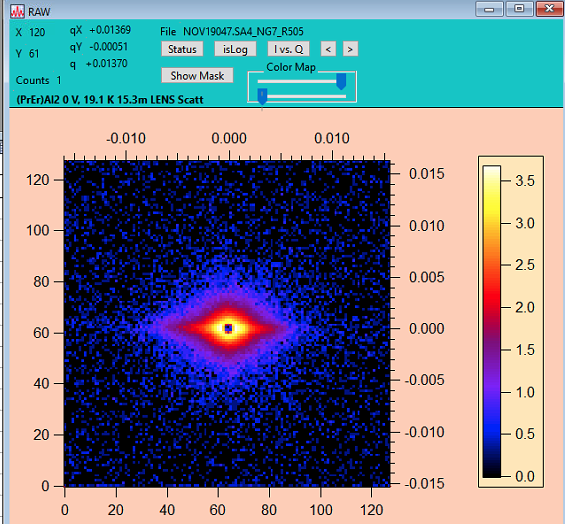

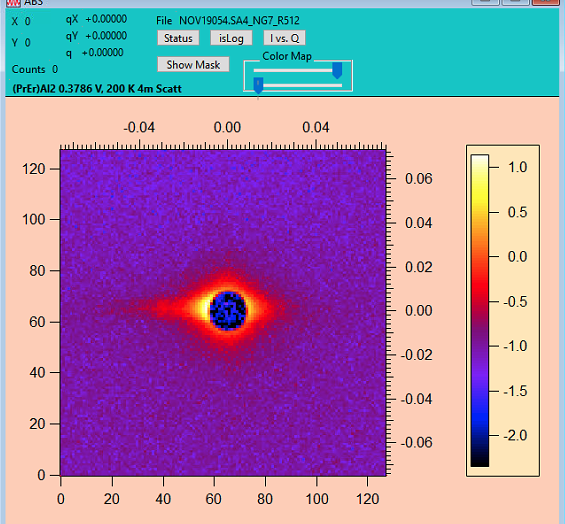

In [26]:
for file in igor_2dfig.glob('*.png'):
    twod_figure(file)

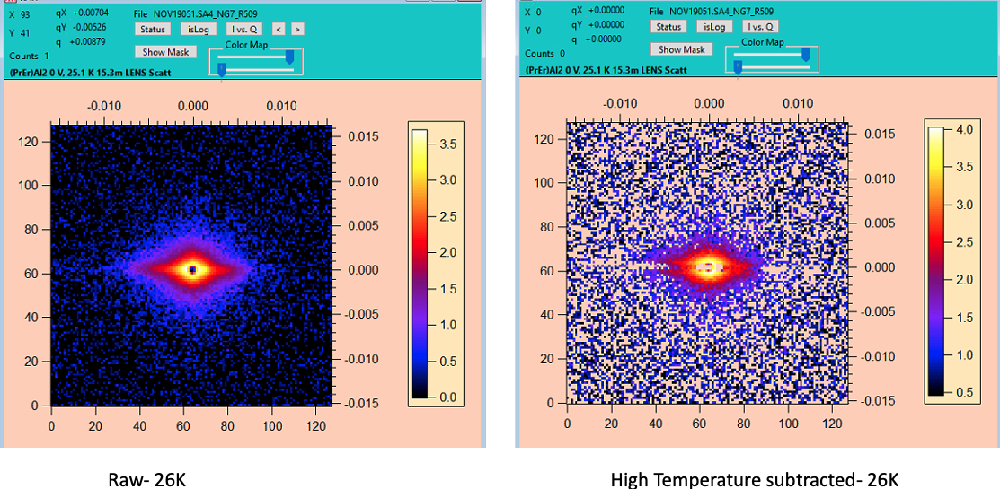

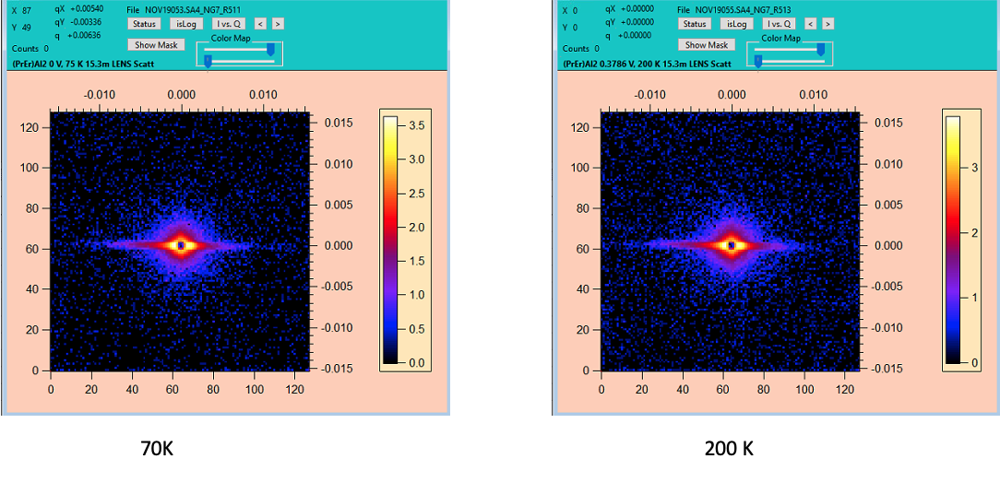

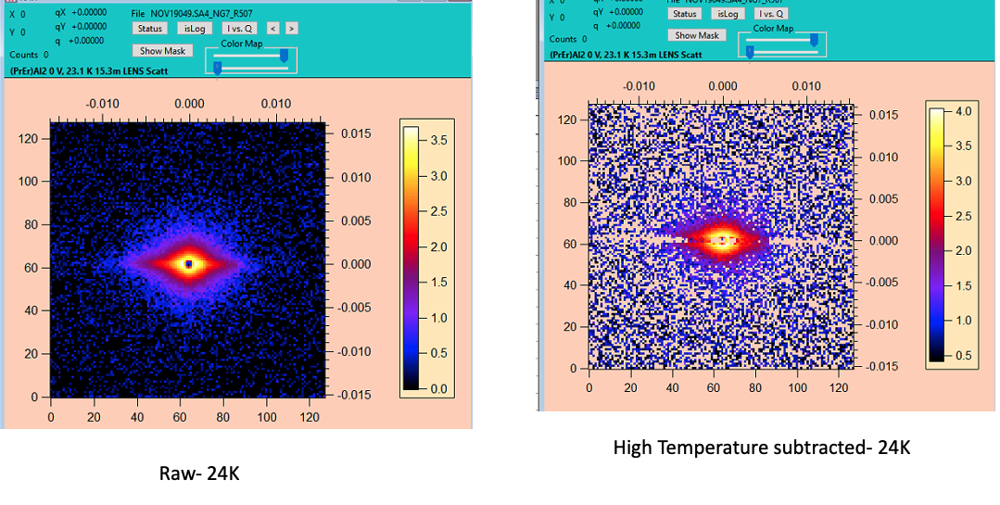

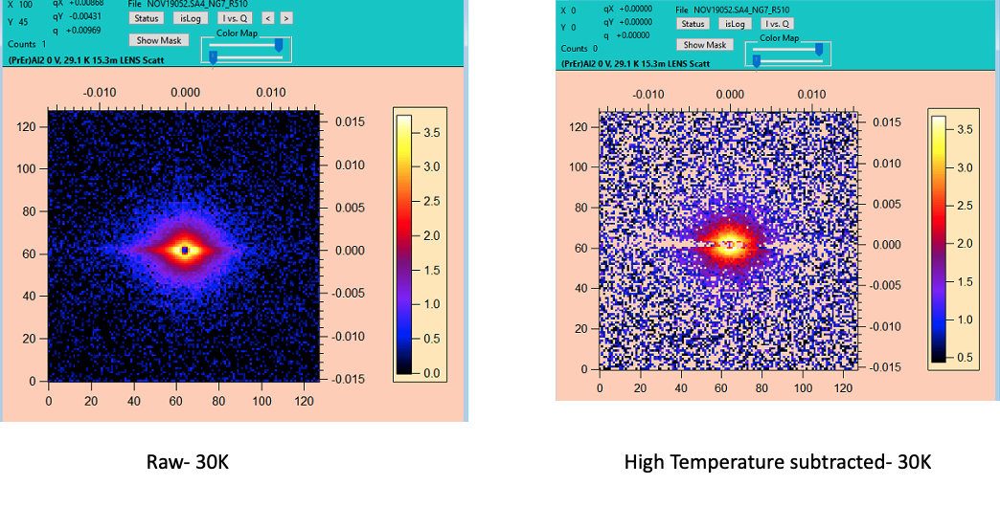

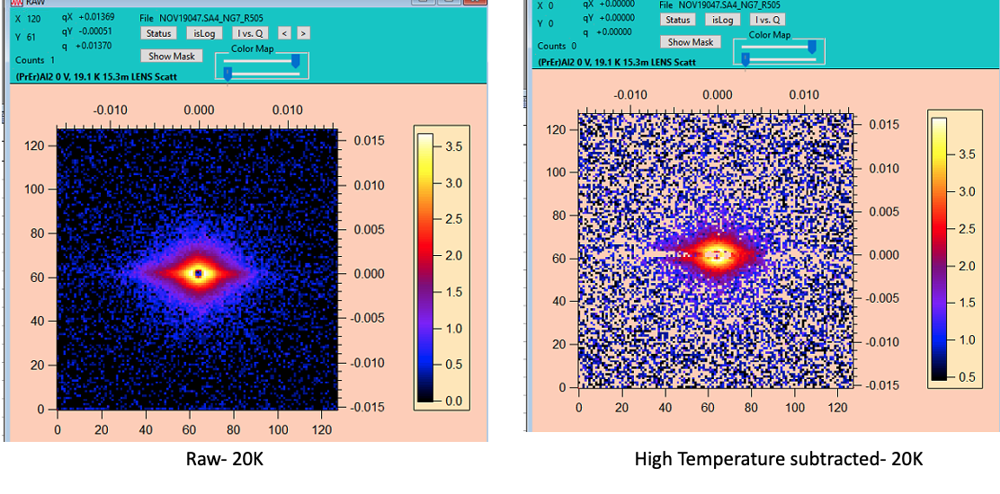

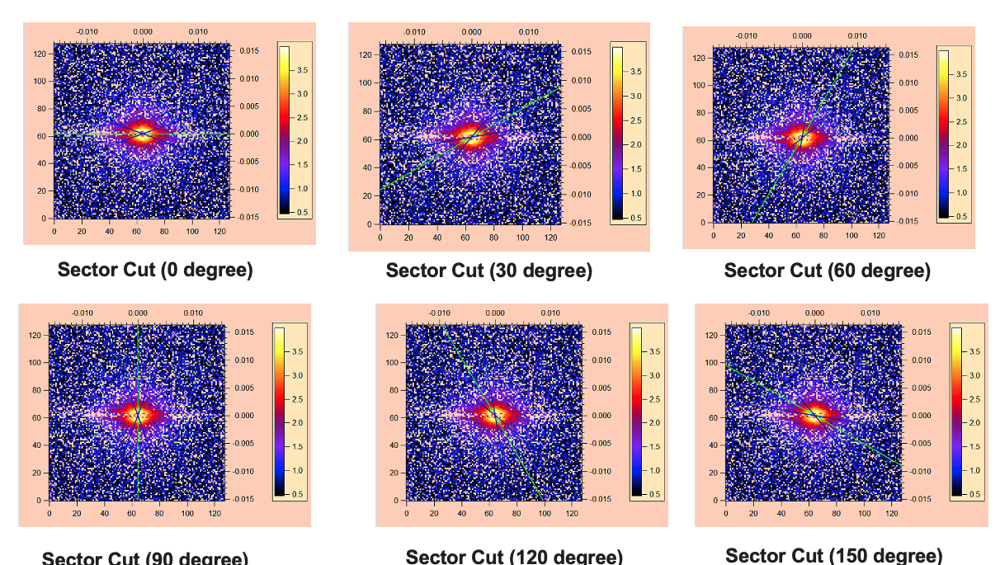

In [22]:
for file in igor_2dfig.glob('s*.png'):
    twod_figure(file)

In [27]:
#Lorentzian square
def lort(x,amp,L1,background=0):
    lo=amp/(x**2+(1/L1**2))
    return lo + background 

def lort2(x,amp,L1,background=0):
    lo2=amp/(x**2+(1/L1**2))**2
    return lo2 + background

#Lorentzian and lorentzian square
def lort_lort2(x,amp1,amp2,L1,L2,background=0):
    lo=amp1/(x**2+(1/L1**2))
    lo2=amp2/(x**2+(1/L2**2))**2
    return lo+ lo2 + background

#Guinier Approximation
#ln(q)=lnI0-Rg**2/3*q**2
def guin(x, slope, intensity, background=0):   
    return (np.log(intensity) - slope*x) +background

In [28]:
#using lmfit- assigning model for lorentzian and lorentziansquare  
lomodel = lmfit.Model(lort,independent_vars='x',nan_policy='omit')
lo2model = lmfit.Model(lort2,independent_vars='x',nan_policy='omit')
lolo2model = lmfit.Model(lort_lort2,independent_vars='x',nan_policy='omit')
guinmodel = lmfit.Model(guin,independent_vars='x',nan_policy='omit')

In [29]:
#For lorentzian  changing parameters like initial, max, and min value
lopars = lomodel.make_params(amp=1e-7,L1=100,background=1)
lopars['background'].set(min=0)
lopars['amp'].set(vary=True,max=0.0000001)
lopars['L1'].set(min=0)

#For lorentzian square- changing parameters like initial, max, and min value
lo2pars = lo2model.make_params(amp=5e-8,L1=1000,background=1)
lo2pars['background'].set(min=0)
lo2pars['amp'].set(vary=True)
lo2pars['L1'].set(min=0)

#for lorentzian_lorentzian2-changing parameters initial, max, and min value
lolo2pars = lolo2model.make_params(amp1=8e-6, amp2=5e-9, L1=1e7, L2=2000,background=1000)
lolo2pars['background'].set(min=0)  #only positive values
lolo2pars['amp1'].set(vary=True,min=0)
lolo2pars['amp2'].vary=False
lolo2pars['L1'].min=0
lolo2pars['L2'].set(min=0)

#changing parameters initial, max, and min value
guinpars=guinmodel.make_params(intensity=0.003,background=0)
guinpars['slope'].value = 0.003
guinpars['intensity'].set(min=0.01)
guinpars['background'].set(min=0,max=100)


In [30]:
lmodel=[guinmodel,lomodel, lo2model,lolo2model]
lpars=[guinpars, lopars, lo2pars, lolo2pars]
#function for fitting
def all_fit(data,position=[0.0001,0.07],lort=False, lort2=False, lort_lort2=False):
    r = []; ks = []
    for k in data:
        sample = data[k]
        d = extract_peak(sample,position)
        #height = d[:,1].max()/100
        if lort:
            fit = lmodel[1].fit(d[:,1],lpars[1],x=d[:,0],method='least_squares')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q')
            plt.ylabel('I')
            plt.xscale("log")
            plt.yscale("log")  
        elif lort2:
            fit = lmodel[2].fit(d[:,1],lpars[2],x=d[:,0],method='least_squares')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q')
            plt.ylabel('I')
            plt.xscale("log")
            plt.yscale("log")
        elif lort_lort2 :
            fit = lmodel[3].fit(d[:,1],lpars[3],x=d[:,0],method='least_squares')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q')
            plt.ylabel('I')
            plt.xscale("log")
            plt.yscale("log")
        else:
            fit =lmodel[0].fit((np.log(d[:,1])),lpars[0],x=(d[:,0]*d[:,0]),method='powell')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q2')
            plt.ylabel('ln(I)')
        ks.append(k)
        r.append(fit.best_values)
        df=pd.DataFrame(r,index=ks)
        
        if not (lort or lort2 or lort_lort2): #for guiner only
            df['size_nm']=(np.sqrt(3*df['slope']))/10
    return df

,amp1,amp2,L1,L2,background
18K_comb_lo,3.894710e-24,5.000000e-09,6.009305e+07,1891.991298,3.465304e-12
20K_comb_lo,9.432871e-22,5.000000e-09,6.009942e+07,1704.443291,1.066692e-11
22K_comb_lo,1.387110e-22,5.000000e-09,1.399842e+08,1699.238479,3.374312e-16
24K_comb_lo,3.703002e-20,5.000000e-09,2.009683e+07,1802.464799,9.455014e-13
25K_comb_lo,4.951526e-20,5.000000e-09,1.976615e+07,1805.704845,2.092471e-15
26K_comb_lo,1.191850e-25,5.000000e-09,1.399932e+08,1838.535706,7.133521e-12
30K_comb_lo,1.359995e-04,5.000000e-09,8.192000e+10,1216.033959,1.846188e+00
75K_comb_lo,9.929796e-09,5.000000e-09,3.569739e-04,1451.307911,8.234968e+00


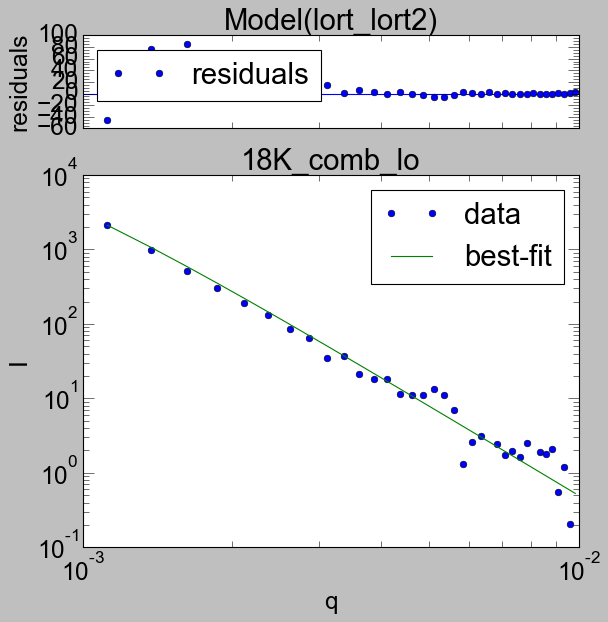

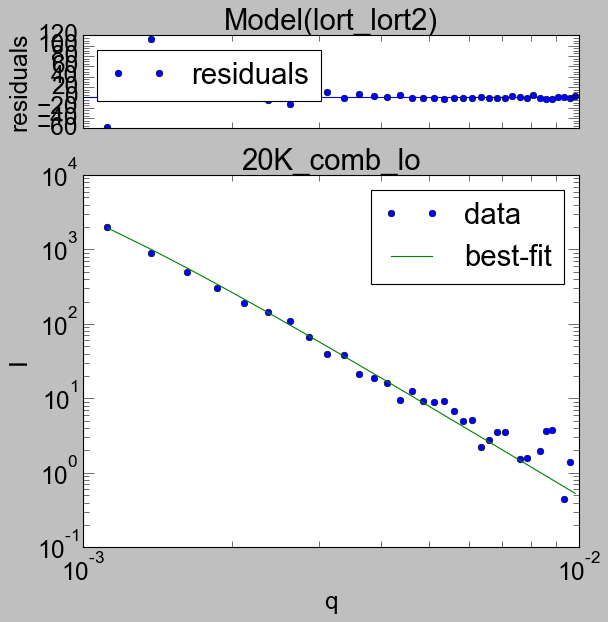

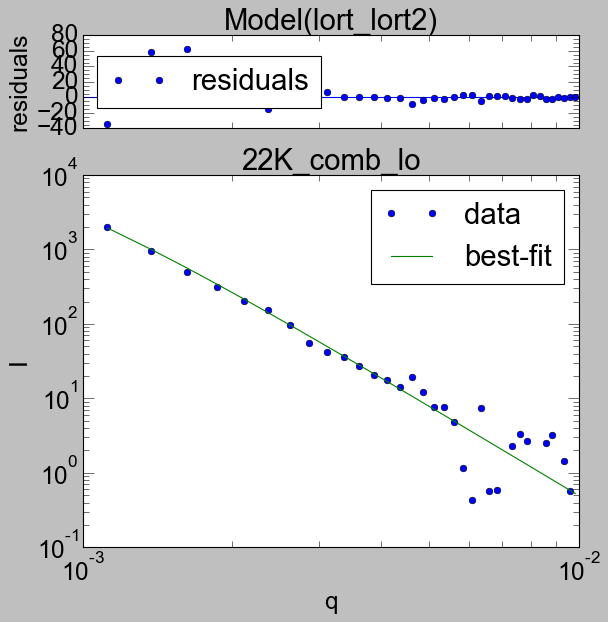

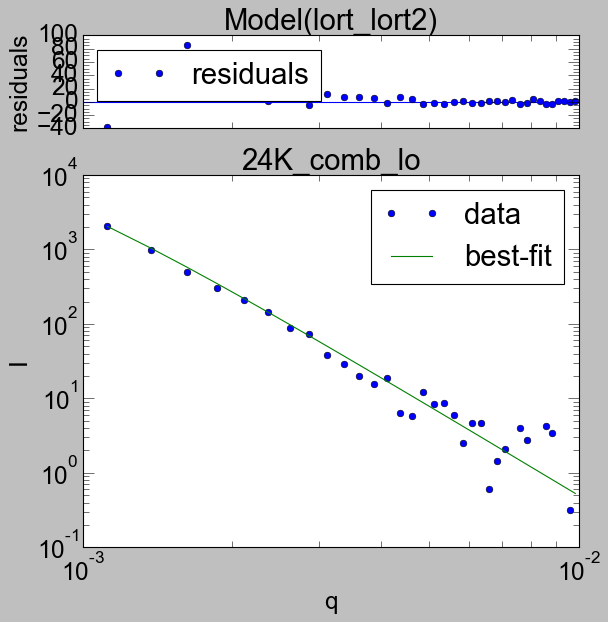

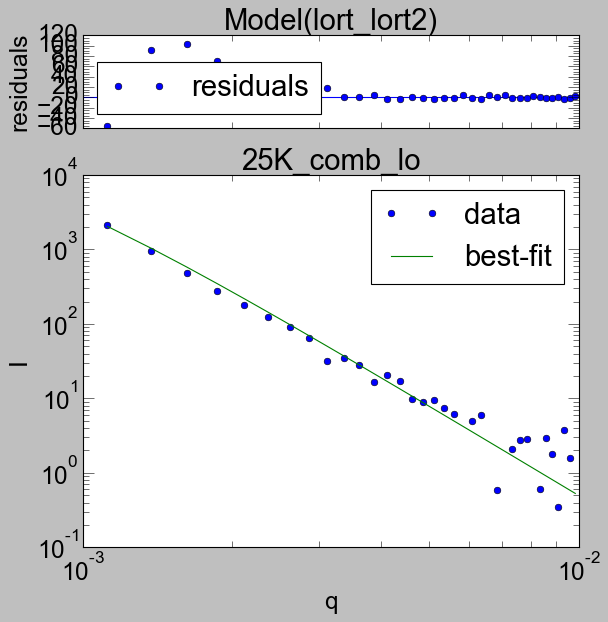

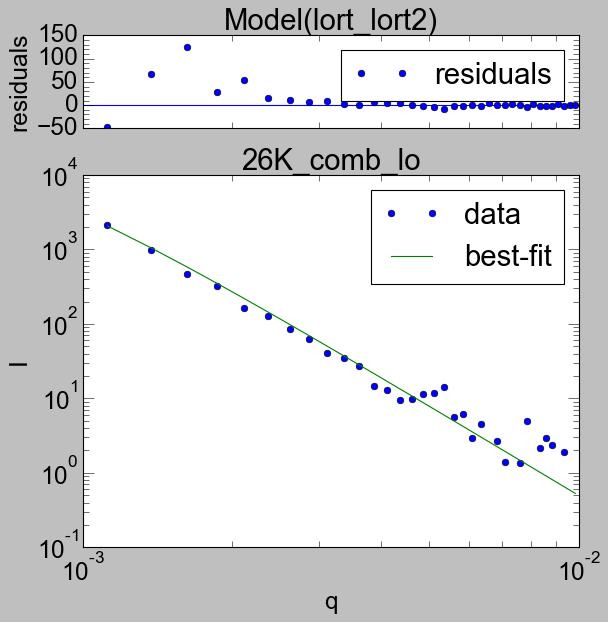

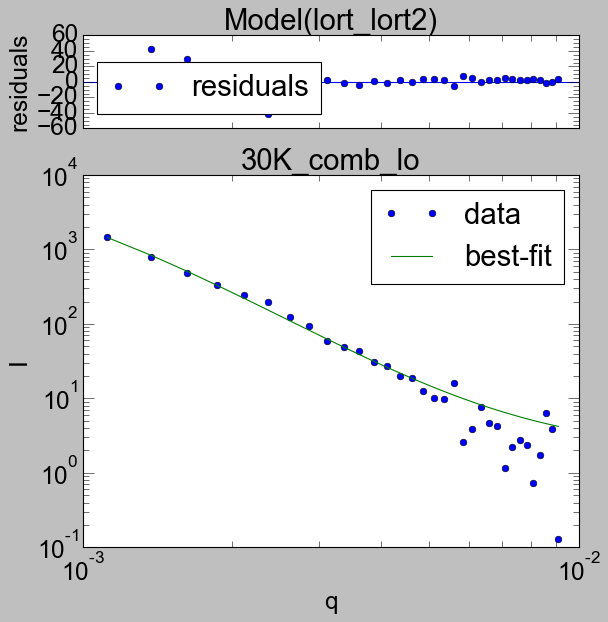

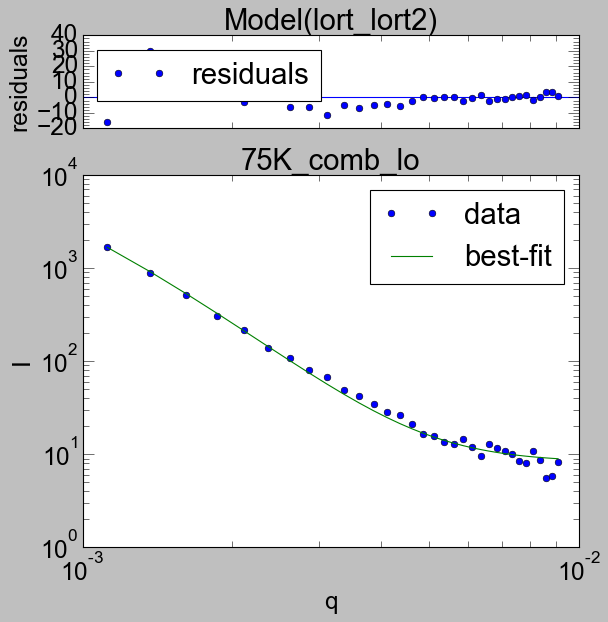

In [31]:
#all temperature vetical cut fit. Both false means guinier fit

all_fit(vert_comb_low, position=[0.001,0.01],lort=False, lort2=False, lort_lort2=True)  #position =[0.002,0.004] for guinier fit
#all_fit(vert_comb_1, position=[0.001,0.01],lort=False, lort2=True, lort_lort2=False)
#all_fit(vert_comb_2, position=[0.001,0.07],lort=False, lort2=False, lort_lort2=False)

,amp,L1,background
18K_comb_lo,2.863148e-08,7.147413e+02,4.761557e-20
20K_comb_lo,2.837824e-08,9.321365e+02,7.007940e-14
22K_comb_lo,3.495273e-08,6.522697e+02,9.545351e-16
24K_comb_lo,3.428313e-08,7.564989e+02,3.573797e-17
25K_comb_lo,3.798863e-08,7.746629e+02,3.281104e-18
26K_comb_lo,4.325205e-08,6.176648e+02,4.568392e-18
30K_comb_lo,1.352719e-08,5.048156e+06,5.120277e-25
75K_comb_lo,5.253905e-08,4.503767e+02,5.707509e+00


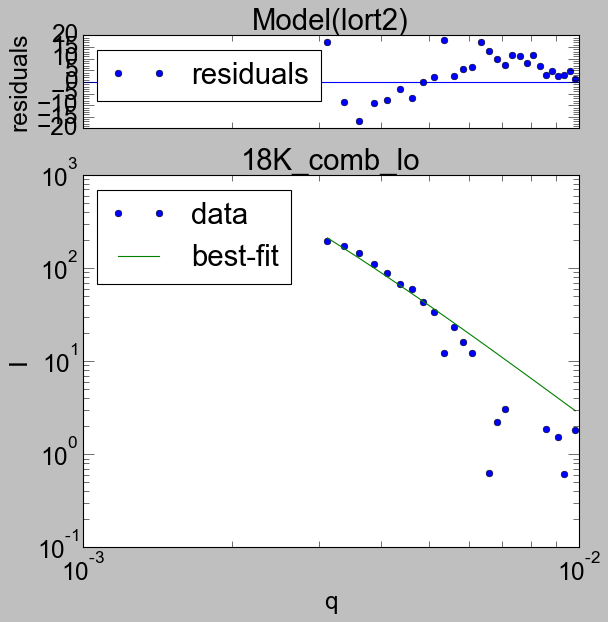

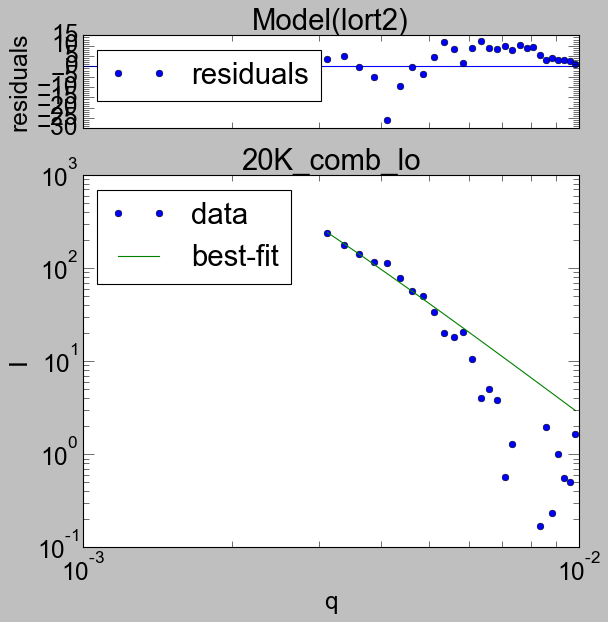

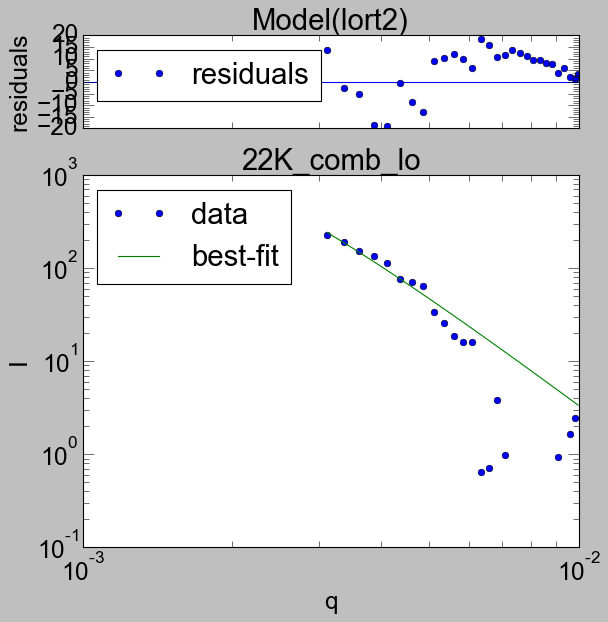

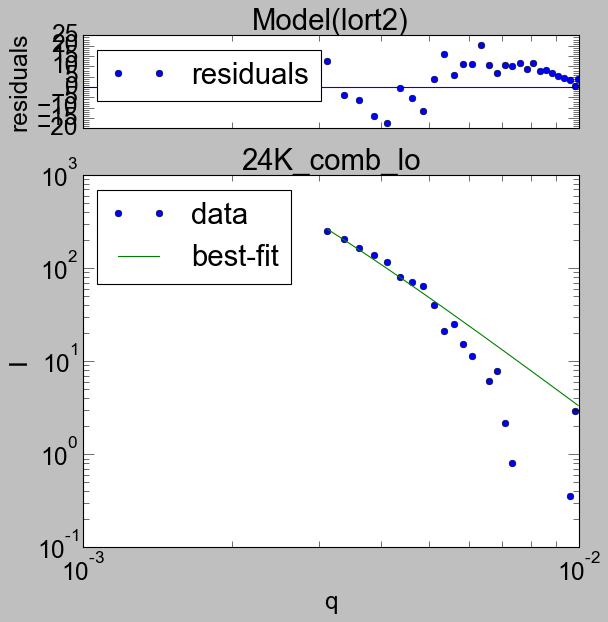

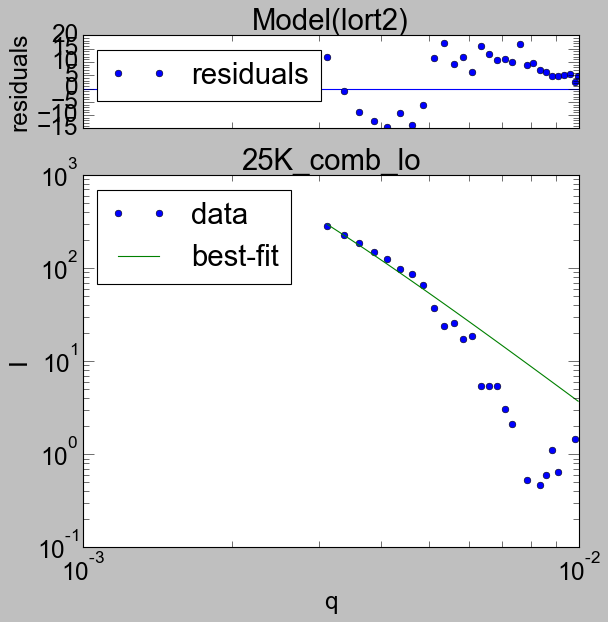

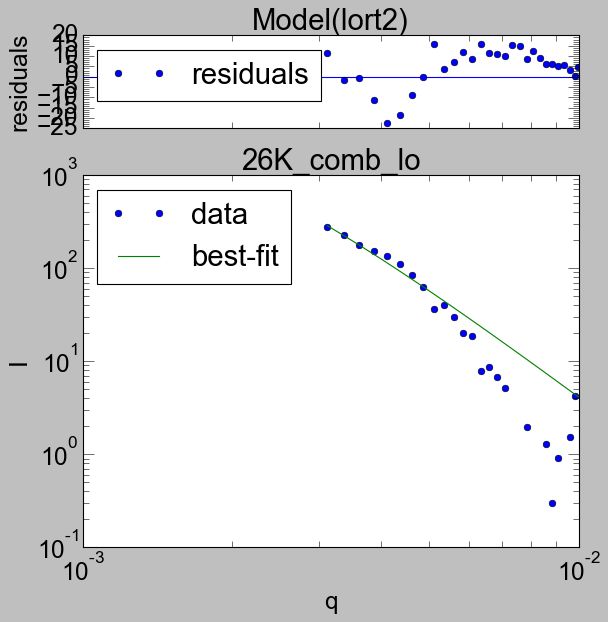

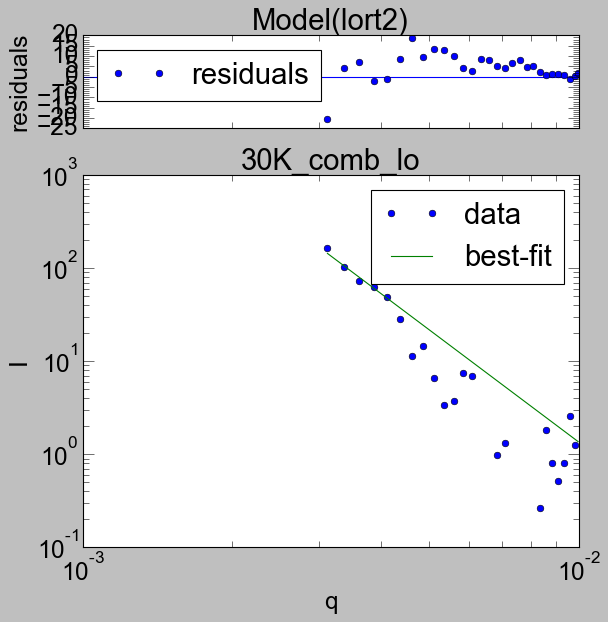

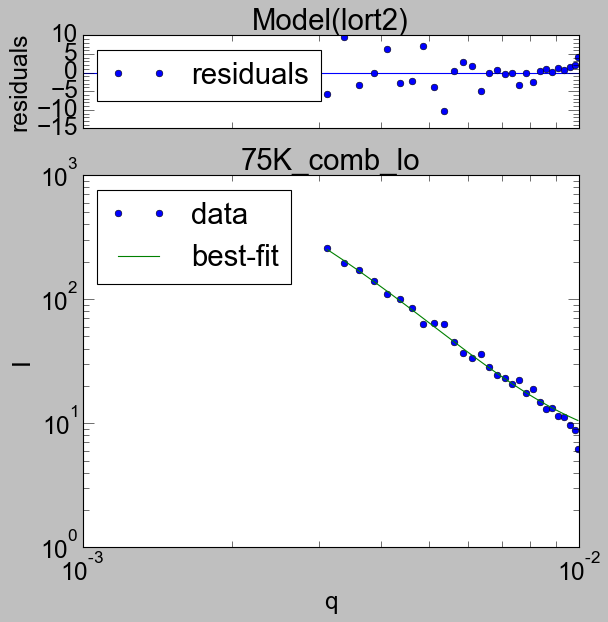

In [28]:
#all temperature horizontal cut fit
all_fit(horz_comb_low, position=[0.003,0.01],lort=False, lort2=True, lort_lort2=True)
#all_fit(horz_comb_1, position=[0.001,0.07],lort=False, lort2=False, lort_lort2=False)
#all_fit(horz_comb_2, position=[0.001,0.07],lort=False, lort2=False, lort_lort2=False)

,amp1,amp2,L1,L2,background
15m_20K_0deg,3.839257e-11,5.000000e-09,5.524444e-01,10.276556,1.063812e+01
15m_20K_120(,1.793239e-03,5.000000e-09,2.918809e+06,691.818755,6.028281e-15
15m_20K_150(,9.335547e-05,5.000000e-09,4.293807e+09,2876.586211,1.626586e-10
15m_20K_30de,1.763005e-03,5.000000e-09,6.005652e+07,835.107622,1.572555e-19
15m_20K_60de,4.299454e-17,5.000000e-09,5.960900e+04,2894.922288,8.478874e-01
15m_20K_90de,1.240662e-20,5.000000e-09,5.946140e+07,1846.098132,1.238262e-14


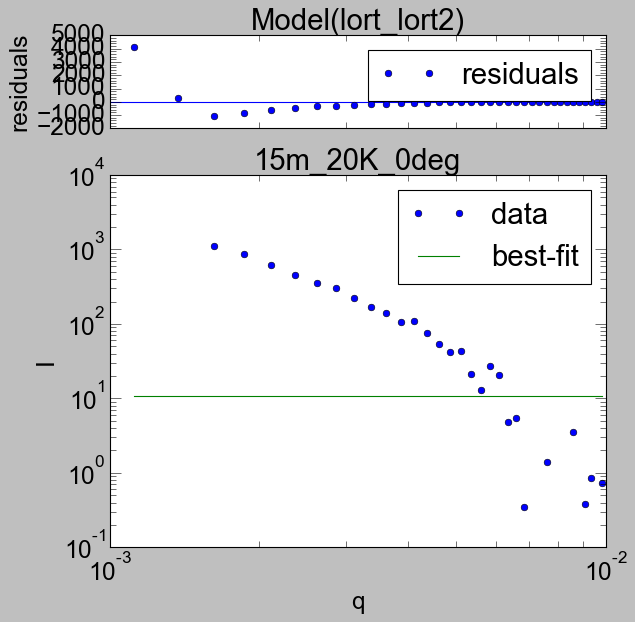

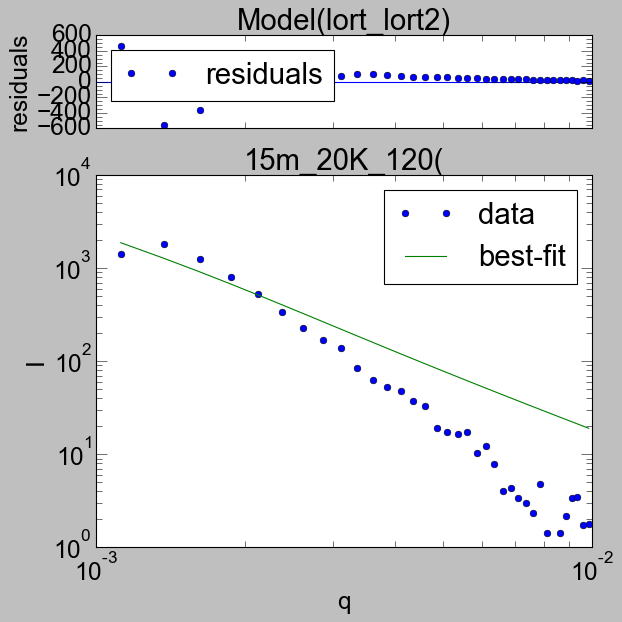

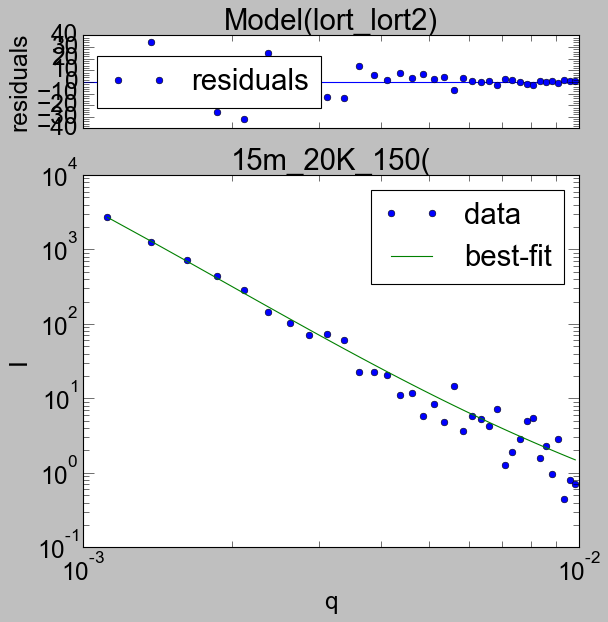

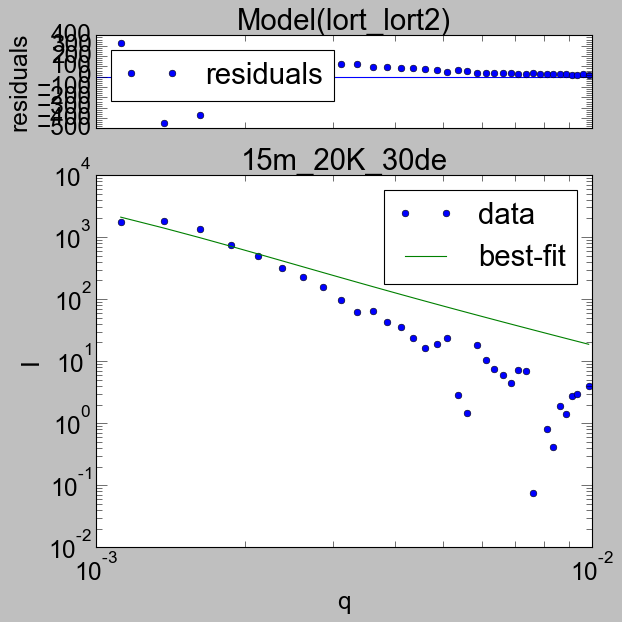

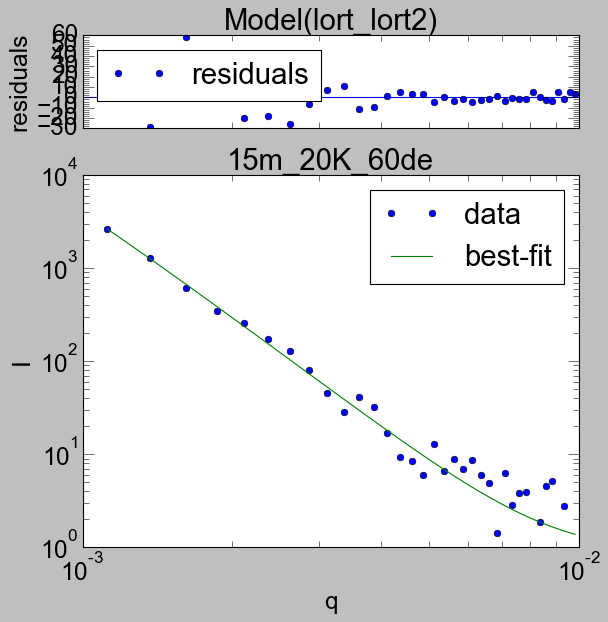

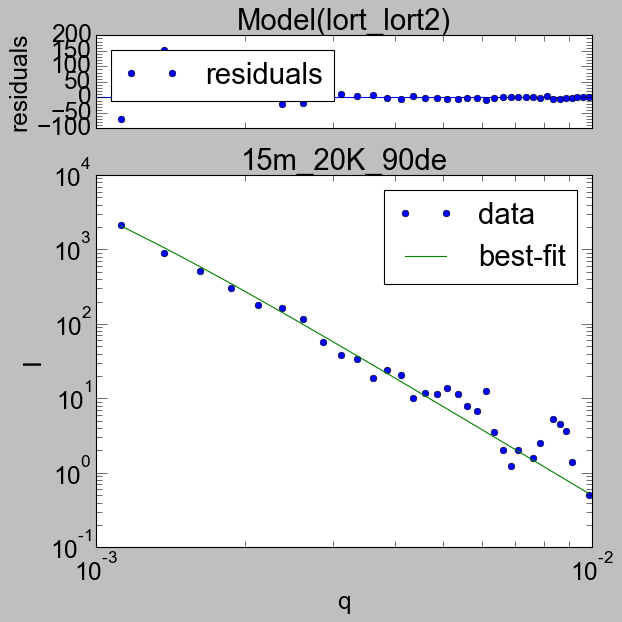

In [32]:
# different temperature sector cut (0,30,60,90,120,150 degree)
sec_18K=load_folder1(sec_folder,'15m_18K*deg*.ASC')
sec_20K=load_folder1(sec_folder,'15m_20K*deg*.ASC')
sec_24K=load_folder1(sec_folder,'15m_24K*deg*.ASC')
sec_26K=load_folder1(sec_folder,'15m_26K*deg*.ASC')
sec_30K=load_folder1(sec_folder,'15m_30K*deg*.ASC')

#all temperature sector cut fit. Both false means guinier fit
all_fit(data=sec_20K, position=[0.001,0.01],lort2=False, lort_lort2=True) #change data for different temp sector fit

In [30]:
#other lorentzian function

In [31]:
#defining lorentzian and lorentzian square
def lorentzian(x,cen,amp,gamma,background=0):
    #lo= amp * gamma**2 / ( gamma**2 + ( x - cen )**2)
    lo = amp / (1 + ((x-cen)/(gamma)))**2
    return lo + background

def lorentzian2(x,cen,amp,gamma,background=0):
    #lo= amp * gamma**2 / ( gamma**2 + ( x - cen )**2)
    lo = amp / (1 + ((x-cen)/(gamma)))**2
    return lo**2 + background

def lorentzian_lorentzian2(x,cen,cen2,amp,amp2, gamma,background=0):
    lo = amp / (1 + ((x-cen)/(gamma)))**2
    lo2 = amp2 / (1 + ((x-cen2)/(gamma))**2)
    return lo + lo2**2 + background

#Guinier Approximation
#ln(q)=lnI0-Rg**2/3*q**2
def guinier(x, slope, intensity, background=0):   
    return (np.log(intensity) - slope*x) +background

guimodel = lmfit.Model(guinier,independent_vars='x',nan_policy='omit')

guipars=guimodel.make_params(intensity=0.003,background=0)


In [32]:
#using lmfit- defining model for lorentzian and lorentziansquare  
lmodel = lmfit.Model(lorentzian,independent_vars='x',nan_policy='omit')
l2model = lmfit.Model(lorentzian2,independent_vars='x',nan_policy='omit')
ll2model = lmfit.Model(lorentzian_lorentzian2,independent_vars='x',nan_policy='omit')

In [33]:
#For lorentzian-changing parameters initial, max, and min value
lpars = lmodel.make_params(cen=0.1,amp=5e-5,gamma=0.1,background=1)
lpars['gamma'].set(min=0,max=1)
lpars['background'].set(min=0,max=100)
lpars['amp'].set(min=0)
lpars['cen'].set(min=0)

#For lorentzian-changing parameters initial, max, and min value
l2pars = l2model.make_params(cen=0.1,amp=5e-5,gamma=0.1,background=1)
l2pars['gamma'].set(min=0,max=1)
l2pars['background'].set(min=0,max=100)
l2pars['amp'].set(min=0)
l2pars['cen'].set(min=0)

#for lorentzian_lorentzian2-changing parameters initial, max, and min value
ll2pars = ll2model.make_params(gamma=0.1, amp=1e-5, amp2=1e-6,cen=1000, cen2=100,background=1)
ll2pars['gamma'].set(min=0,max=1)
ll2pars['background'].set(min=0,max=1)
ll2pars['amp'].set(min=0)
ll2pars['amp2'].set(min=0)
ll2pars['cen'].set(min=0)
ll2pars['cen2'].set(min=0)

#changing parameters initial, max, and min value
guipars=guimodel.make_params(intensity=0.003,background=0)
guipars['slope'].value = 0.003
guipars['intensity'].set(min=0.01)
guipars['background'].set(min=0,max=100)

In [34]:
llmodel=[guimodel,lmodel, l2model,ll2model]
llpars=[guipars, lpars, l2pars, ll2pars]

In [35]:
#function for fitting
def fit_set(data,position,loren=False, loren2=False, loren_loren2=False):
    r = []; ks = []
    for k in data:
        sample = data[k]
        d = extract_peak(sample,position)
        center = (position[0]+position[1])/2
        height = d[:,1].max()/10
        if loren:
            fit = llmodel[1].fit(d[:,1],llpars[1],x=d[:,0],amp=height, cen=center,method='least_squares')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q')
            plt.ylabel('I')
            plt.xscale("log")
            plt.yscale("log")
        elif loren2:
            fit = llmodel[2].fit(d[:,1],llpars[2],x=d[:,0],amp=height, cen=center,method='least_squares')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q')
            plt.ylabel('I')
            plt.xscale("log")
            plt.yscale("log")
        elif loren_loren2 :
            fit = llmodel[3].fit(d[:,1],llpars[3],x=d[:,0],amp=height,amp2=height*1000,cen=center, 
                                 cen2=center/10,method='least_squares')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q')
            plt.ylabel('I')
            plt.xscale("log")
            plt.yscale("log")
        else:
            fit =llmodel[0].fit((np.log(d[:,1])),llpars[0],x=(d[:,0]*d[:,0]),method='powell')
            fit.plot()
            plt.title(f'{k}')
            plt.xlabel('q2')
            plt.ylabel('ln(I)')
        ks.append(k)
        r.append(fit.best_values)
        df=pd.DataFrame(r,index=ks)
        
        if not (loren or loren2 or loren_loren2): #for guiner only
            df['size_nm']=(np.sqrt(3*df['slope']))/10
    return df

,cen,cen2,amp,amp2,gamma,background
18K_comb_lo,0.001325,2.246084e-09,7.621788,627.701664,0.000315,1.000000
20K_comb_lo,0.000024,2.283390e-31,6.094129,915.956999,0.000254,0.110403
22K_comb_lo,0.002582,4.000673e-08,5.144307,561.065582,0.000329,1.000000
24K_comb_lo,0.001262,1.731333e-08,11.080012,509.767229,0.000350,0.999530
25K_comb_lo,0.001285,5.115407e-05,2.901339,587.885430,0.000311,1.000000
26K_comb_lo,0.015199,4.021998e-05,2.652625,586.971349,0.000315,1.000000
30K_comb_lo,0.003589,2.615930e-38,146.965387,99999.095968,0.000988,1.000000
75K_comb_lo,0.000026,2.173573e-31,6.428995,819.803218,0.000261,0.157786


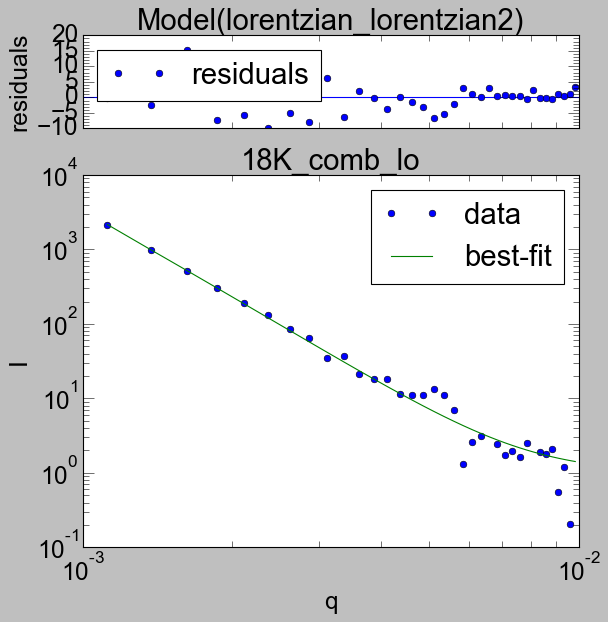

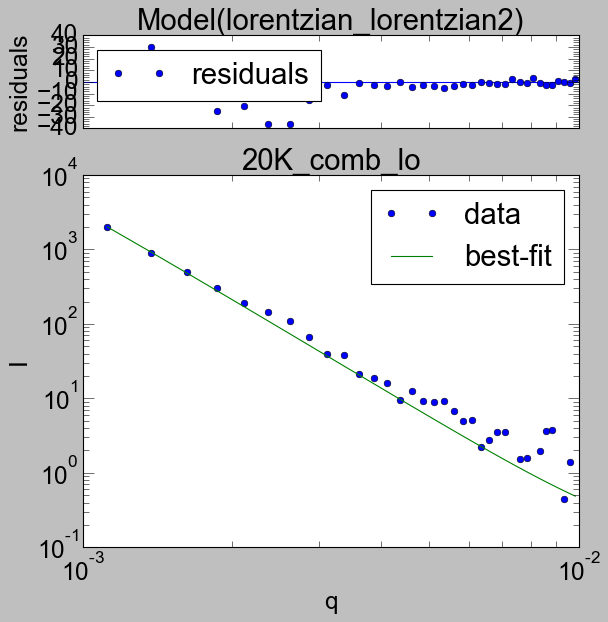

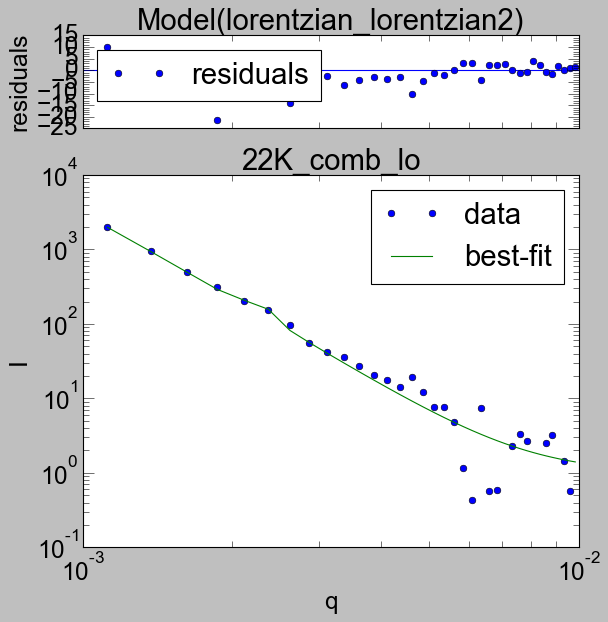

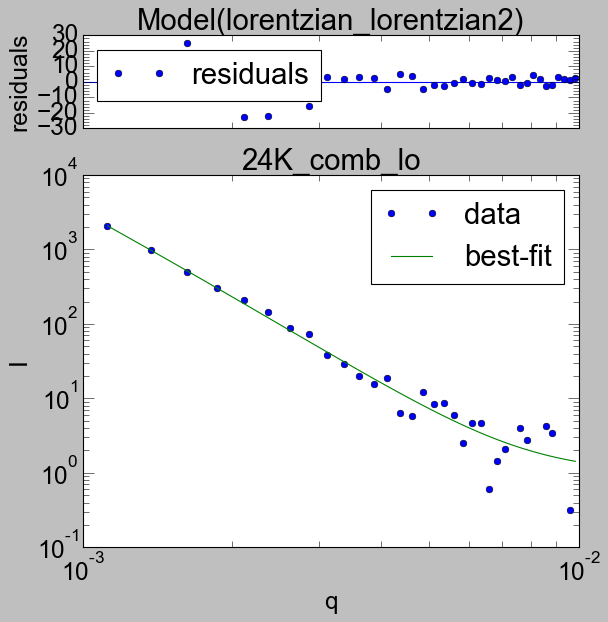

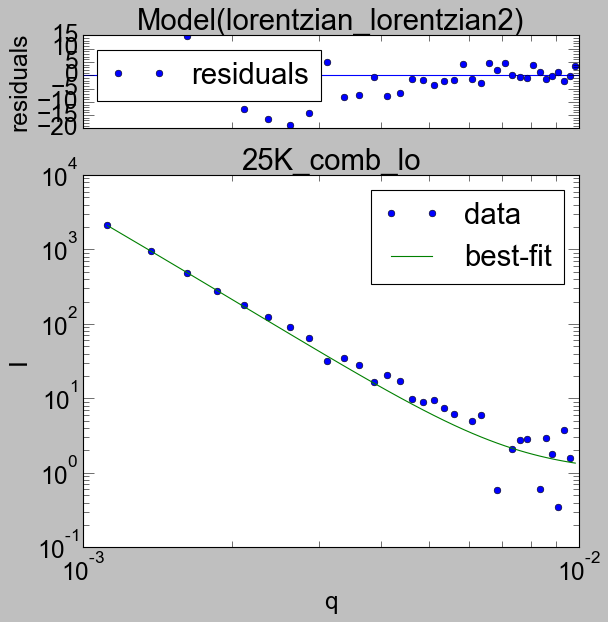

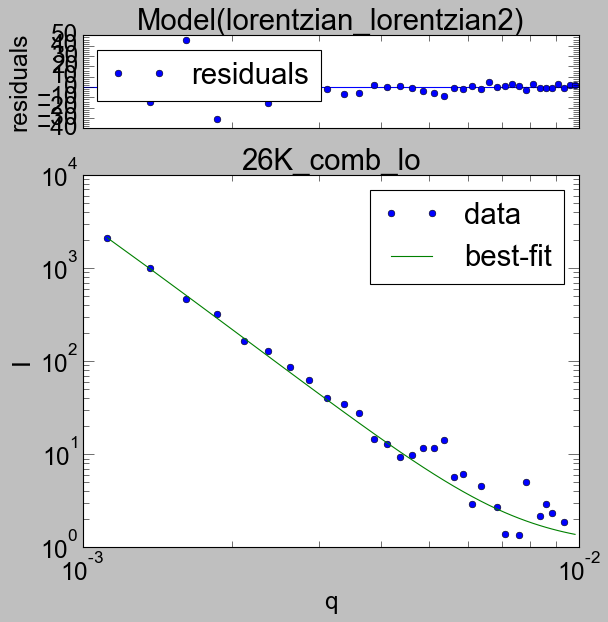

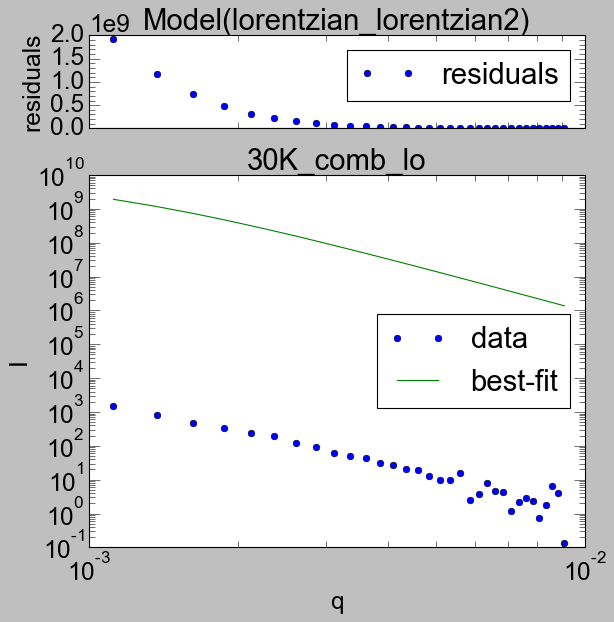

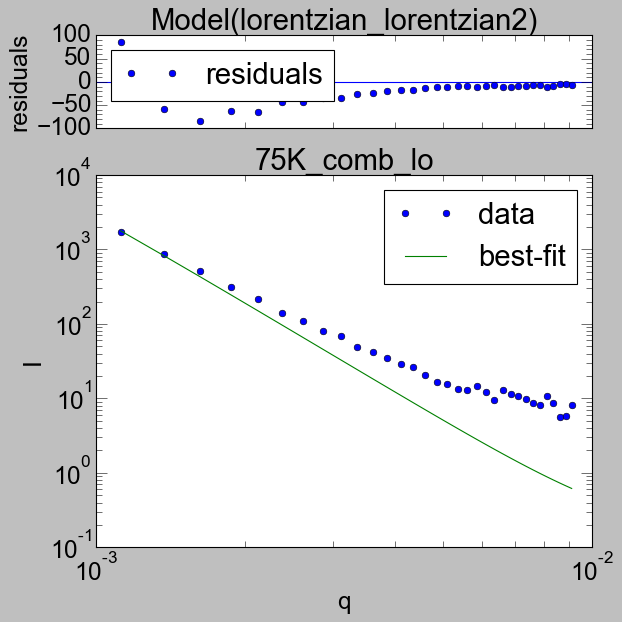

In [36]:
#all temperature vetical cut fit. both false means guinier fit
fit_set(vert_comb_low, position=[0.001,0.01],loren=False, loren2=False, loren_loren2=True)  #position =[0.002,0.004] for guinier fit
#fit_set(vert_comb_1, position=[0.0001,0.07],loren2=False, loren_loren2=False)
#fit_set(vert_comb_2, position=[0.0001,0.07],loren2=False, loren_loren2=False)

,cen,cen2,amp,amp2,gamma,background
18K_comb_lo,2.506972e-06,5.888718e-04,1.996728e-02,2.066996e+01,1.851984e-04,2.254462e-03
20K_comb_lo,6.352261e-03,2.451246e-06,3.537454e+02,1.571114e-04,4.345523e-09,7.542682e-08
22K_comb_lo,6.390370e-13,3.195358e+02,7.547795e-07,1.365534e-05,1.743644e-12,3.399979e-13
24K_comb_lo,1.118664e-02,2.475785e+03,4.321326e-03,3.962252e+00,8.911484e-05,4.988684e-28
25K_comb_lo,7.138132e-03,9.454063e+02,1.800110e-01,8.571158e-06,1.656845e-03,5.358644e-15
26K_comb_lo,1.684139e-02,2.696840e+03,8.638215e-04,1.336025e+00,1.922252e-06,3.251088e-23
30K_comb_lo,1.384609e-11,2.300351e-07,4.523497e+02,2.262953e+02,3.192232e-10,9.999999e-01
75K_comb_lo,3.503450e-02,2.610155e-18,2.740000e+03,2.739999e+06,4.561555e-03,1.000000e+00


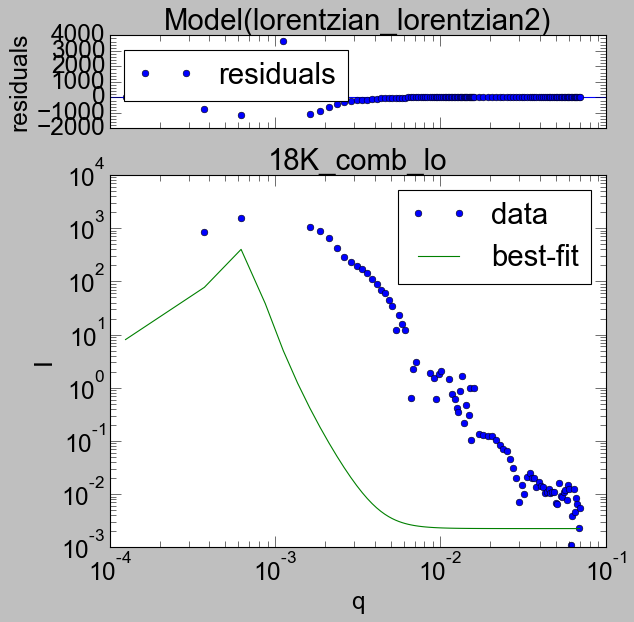

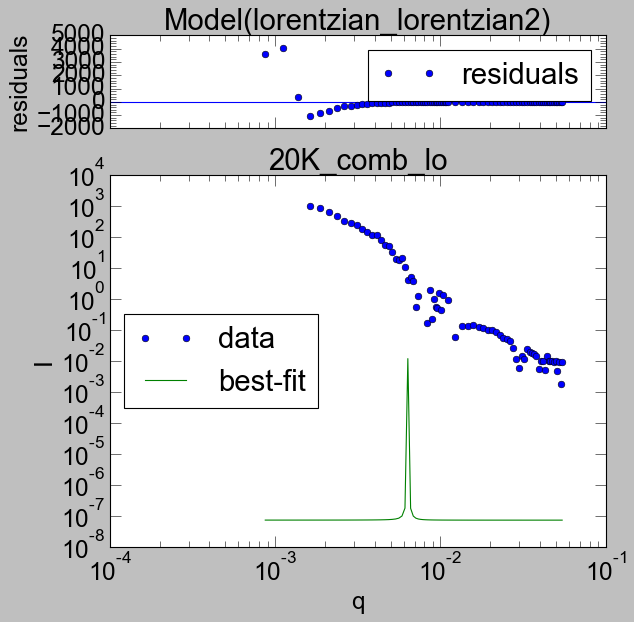

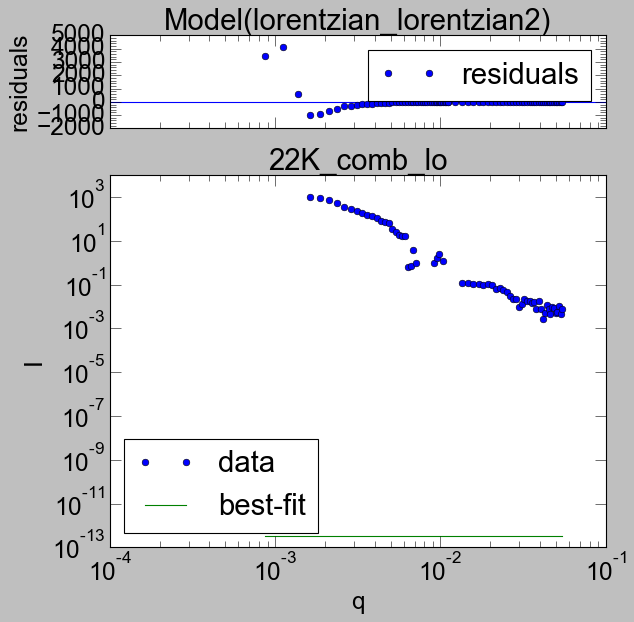

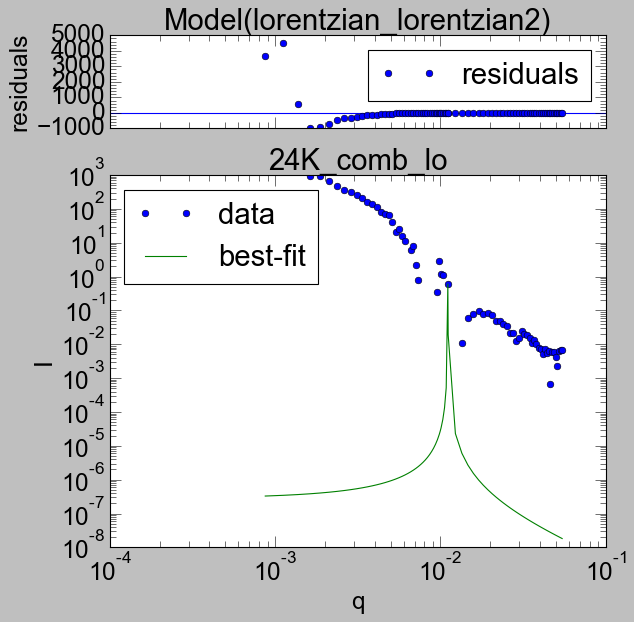

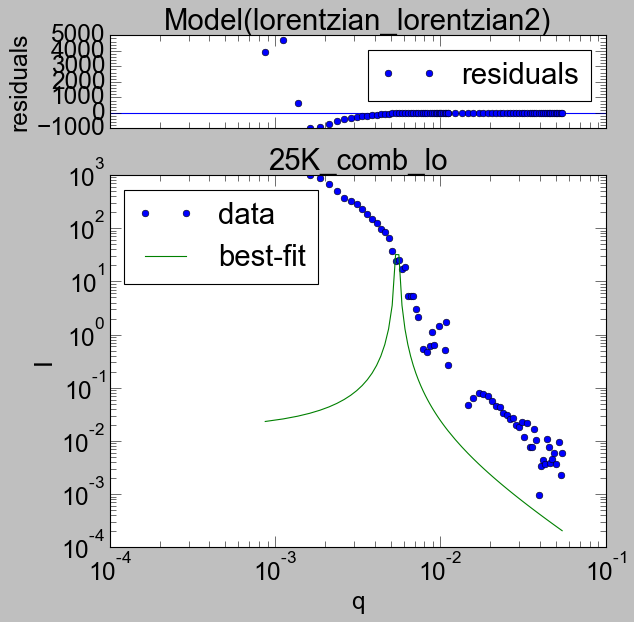

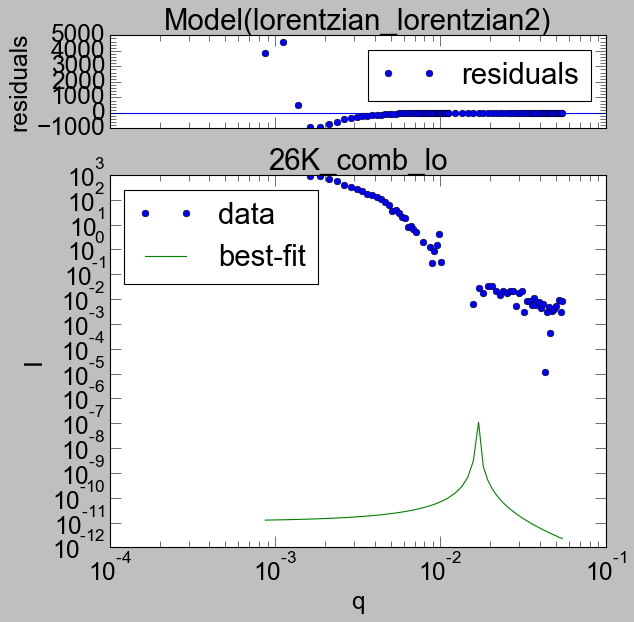

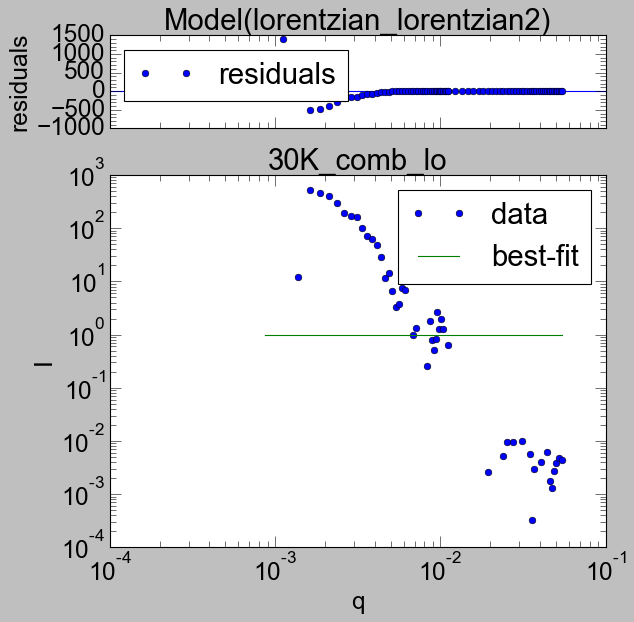

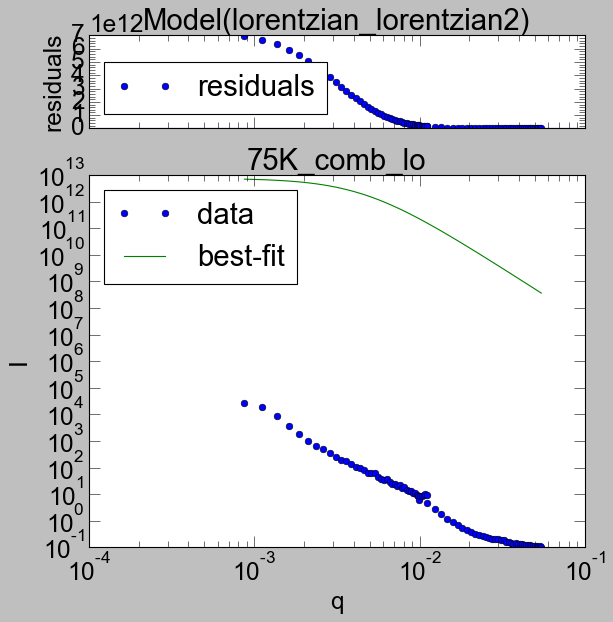

In [37]:
#all temperature horizontal cut fit
fit_set(horz_comb_low, position=[0.0001,0.07],loren=False, loren2=False, loren_loren2=True)
#fit_set(horz_comb_1, position=[0.0001,0.07],loren2=False, loren_loren2=False)
#fit_set(horz_comb_2, position=[0.0001,0.07],loren2=False, loren_loren2=False)

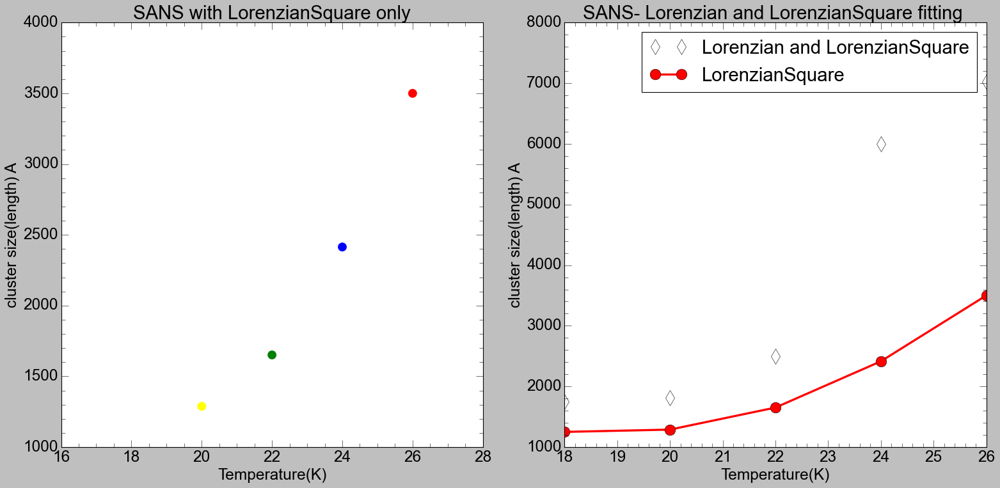

In [38]:
#plotting sasview fit data
x_LS=[18,20, 22, 24, 26]
y_LS=[1250, 1288,1651.2, 2414, 3500]
y_LLS=[1750, 1814,2503, 6000, 7021]
fig, (ax1, ax2)=plt.subplots(1,2, figsize=(20,10))
ax1.scatter(x_LS, y_LS, marker='o', color=[ 'white','yellow','green','blue','red'],linewidth=8)
ax1.set(xlabel="Temperature(K)", ylabel='cluster size(length) A', title='SANS with LorenzianSquare only')
ax2.plot(x_LS, y_LLS, marker='d', markersize=15, color='white', linewidth=3, label='Lorenzian and LorenzianSquare')
ax2.plot(x_LS, y_LS, marker='o', markersize=15,color='red', linewidth=3, label='LorenzianSquare')
ax2.set(xlabel="Temperature(K)", ylabel='cluster size(length) A', title='SANS- Lorenzian and LorenzianSquare fitting ')
fig.tight_layout()
plt.legend()
plt.show()

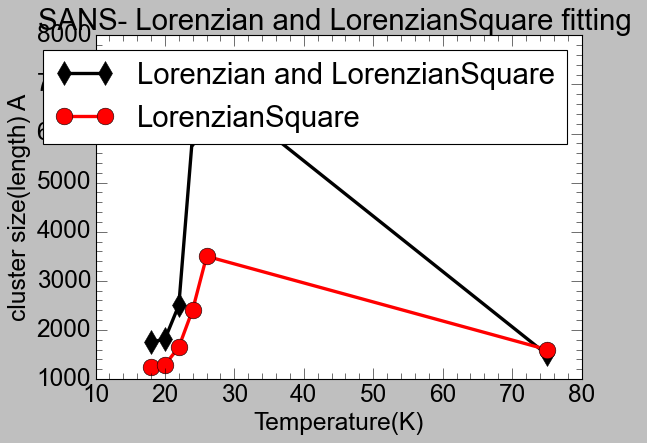

In [39]:

x_LS=[18,20, 22, 24, 26,75]
y_LS=[1250, 1288,1651.2, 2414, 3500,1600]
y_LLS=[1750, 1814,2503, 6000, 7021,1500]
fig, ax=plt.subplots()
ax.plot(x_LS, y_LLS, marker='d', markersize=15, color='black', linewidth=3, label='Lorenzian and LorenzianSquare')
ax.plot(x_LS, y_LS, marker='o', markersize=15,color='red', linewidth=3, label='LorenzianSquare')
ax.set(xlabel="Temperature(K)", ylabel='cluster size(length) A', title='SANS- Lorenzian and LorenzianSquare fitting ')
fig.tight_layout()
plt.legend()
plt.show()


In [40]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
x_LS=[18,20, 22, 24, 26, 75]
y_LS=[1250, 1288,1651.2, 2414, 3500, 1600]
y_LLS=[1750, 1814,2503, 6000, 7021,1500]
color1=[ 'navy','yellowgreen','indigo','maroon','pink']
color2=[ 'white','yellow','green','blue','red']
sns.set_style('dark')

sns.stripplot(x_LS, y_LLS, marker='d', hue=color1,linewidth=8)
sns.stripplot(x_LS, y_LS, marker='o', hue=color2,linewidth=8)
ax.set(xlabel="Temperature(K)", ylabel='cluster size(length) A', title='SANS- Lorenzian and LorenzianSquare fitting ')
fig.tight_layout()
plt.legend()
plt.show()
plt.savefig('LLS_and_LS.png');

/Users/sudippandey/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


KeyError: 18

In [ ]:
def fit_sqt(data, model='lort_lort2', **kwargs):

    A    = kwargs.pop('A',  1.0)
    A1   = kwargs.pop('A1',  1.0)
    L1   = kwargs.pop('A1',  1.0)
    L2   = kwargs.pop('A1',  1.0)
    B    = kwargs.pop('B',  1.0)
    t0   = kwargs.pop('t0', 1.0)
    I=kwargs.pop('I', 1.0)
    m=kwargs.pop('m', 1.0)
    init_par = kwargs.pop('init_par', None)
    
    function_library = {
        'Lort'      : lambda x, L1, A, B: A/(x**2+(1/L1**2))+B,
        'Lort2'     : lambda x, L1, A, B: (A/(x**2+(1/L1**2))**2)+B,
        'Lort_Lort2': lambda x, L1, L2, A, A1, B: A/(x**2+(1/L1**2))+A1/(x**2+(1/L1**2))**2+B,
        'Guin'      : lambda x, I, m, A: (np.log(I) - m*x) +B,
        'Exp'       : lambda t, t0, A:      A*np.exp(-(t/t0)),         # simple exponential function
        'Power'     : lambda x, b,  A:      A*x**b,                        # power law
        'Linear'    : lambda x, x0, A:      A*(x-x0),                      # linear function
        'Constant'  : lambda x, A:          A*np.ones_like(x),             # constant
        
    }
    q  = data[0]
    inten  = data[1]
    ierr = data[2]

    func = function_library.get(model, None)
    if func is None: raise RuntimeError(f"model {model} is invalid")

    popt, pcov = curve_fit(func, q, inten, 
                           sigma=ierr, p0=init_par,
                             maxfev=10000, ftol=1e-5)
    #popt gives all the best value parameters in order of your function
    par, epar  = popt[0], np.sqrt(pcov[0,0])
    perr = np.sqrt(np.diag(pcov))
    fit_func = lambda x : func(x, *popt)
    chisq = np.sum(((fit_func(q) - inten)/ierr)**2)
    chisq = chisq/(len(inten) - len(popt))
    return (par,epar,fit_func, chisq, popt,perr)

In [ ]:
def main(*args, **kwargs):
    model = kwargs.pop('model', 'KWW-Norm') # fit model (see fit_sqt)
    mpars = kwargs.pop('model_pars', {} )   # model parameters
    plot_summary = kwargs.pop('plot_summary', True)
    plot_fits    = kwargs.pop('plot_fits', True)
    data_dir     = kwargs.pop('data_dir', '.')
    
    results = []           # list of fit results
    print("# ", model)
    for sample in args:
        if model.startswith('lort_lort2'):
            print("# chi2     L1          L2        A     A1    B    extra_pars")
        elif model.startswith('guin'):
            print("# chi2      I     M      A       extra_pars")
        else:
            print("chi2     L1      A       B     extra_pars")
        if plot_fits:
            plt.figure(figsize=(10,10))
        fitres = []
        outfile = label.replace('/','_').replace(' ','_').replace('=','').lower() # nice file name


        for k in data:
            sample = data[k]
            d = extract_peak(sample,position)
            q  = data[0]
            inten  = data[1]
            ierr = data[2]

            #alabel = r"Q=%.3f $\AA^{-1}$ %s" % (q, slabel)
            if plot_fits:
                p = plt.errorbar(q, inten, yerr=ierr,fmt='s')
                acolor = p[0].get_color()
            par0, epar0, fit_func, chi2, popt,perr = fit_sqt(d, model=model, 
                                             **mpars)
            if plot_fits:
                ftau = np.logspace(np.log10(min(q))-0.2, np.log10(max(q))+0.2)
                    #ftau = np.logspace(-2,2)
                fsqt = fit_func(ftau)
                plt.plot(ftau, fsqt, '--', color=acolor) # fit
            print(f'{chi2:.3g},{par0:.3e}, \t' , end="")
            if len(popt)>1:
                print(",\t".join([f'{x :.2g}' for x in popt[1:]]), end=" ")
            resline =list(popt) + list(perr)
            print()
            fitres.append(resline)
            #data = np.vstack((q,inten,dsqt))

            #write_csv("%s-q-%.3f.csv" % (outfile,q), data, label=label, q=q, dq=dq)
        
        results.append((label, fitres))

        if plot_fits:
            plt.xscale('log')
            plt.yscale('log')
            #plt.yscale('log')
            plt.xlim(left=0.0001,right=0.7)
            plt.xlabel(r'$\Q$ [A-1]')
            plt.ylabel(r'$Intensity$')
            plt.title("%s (%s)" % (label, model))
            plt.grid(which='both')
            plt.legend(loc=0)
            figname=f"{str(outfile)}.pdf"
            plt.savefig('Figures/'+figname)

    plt.show()